In [1]:
from sklearn.datasets import make_classification
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
%matplotlib inline

# Generate data
X, y = make_classification(n_samples=100, n_features=2, n_informative=1, n_redundant=0,
                           n_classes=2, n_clusters_per_class=1, random_state=41, hypercube=False, class_sep=10)

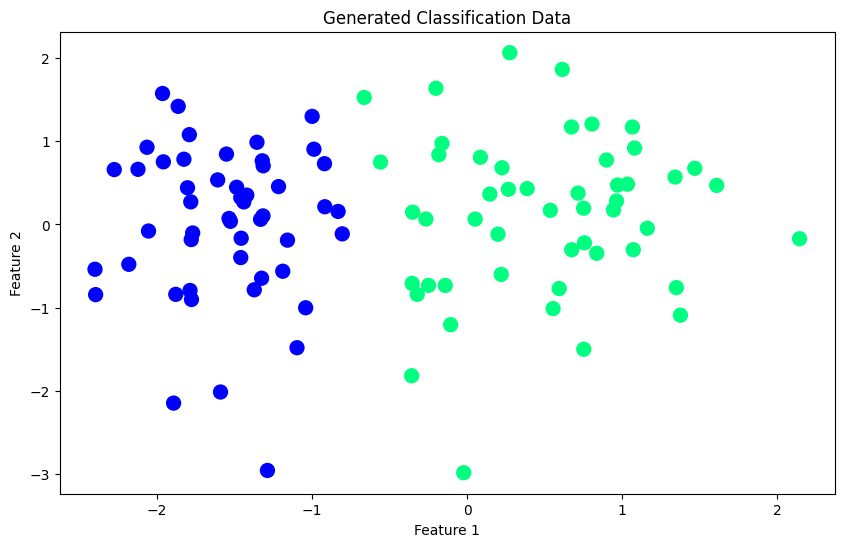

In [2]:
# Visualize data
plt.figure(figsize=(10, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)
plt.title('Generated Classification Data')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.show()

In [3]:
# Step function
def step(z):
    return 1 if z > 0 else 0

In [4]:
# Below is the basic implementation of the perceptron trick for classification using logistic regression

# def perceptron(X,y):
    
#     X = np.insert(X,0,1,axis=1)
#     weights = np.ones(X.shape[1])
#     lr = 0.1
    
#     for i in range(1000):
#         j = np.random.randint(0,100)
#         y_hat = step(np.dot(X[j],weights))
#         weights = weights + lr*(y[j]-y_hat)*X[j]
        
#     return weights[0],weights[1:]

# intercept_,coef_ = perceptron(X,y)
# print(intercept_)
# print(coef_)

In [5]:
# Modified perceptron function to save all weights
def perceptron(X, y, n_iterations=1000):
    X = np.insert(X, 0, 1, axis=1)
    weights_history = []
    
    # Initialize weights
    weights = np.ones(X.shape[1])
    weights_history.append(weights.copy())
    
    lr = 0.1  # Learning rate
    
    for i in range(n_iterations):
        j = np.random.randint(0, len(X))  # Pick random sample
        y_hat = step(np.dot(X[j], weights))
        weights = weights + lr * (y[j] - y_hat) * X[j]
        weights_history.append(weights.copy())  # Save weights at each iteration
    
    return np.array(weights_history)

In [6]:
# Run perceptron
weights_history = perceptron(X, y, n_iterations=1000)
print(f"Initial weights: {weights_history[0]}")
print(f"Final weights: {weights_history[-1]}")

Initial weights: [1. 1. 1.]
Final weights: [0.9        1.31777481 0.22183208]


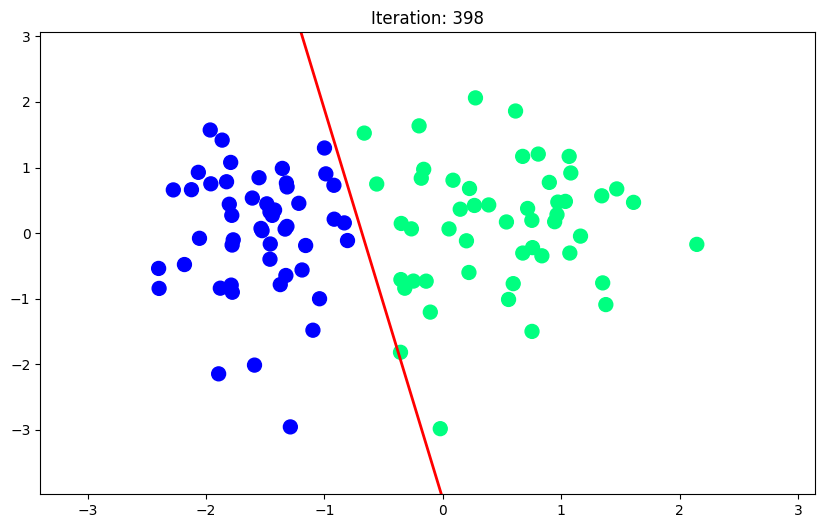

In [7]:
# HTML output to make the animation visible
fig, ax = plt.subplots(figsize=(10, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)

# Set plot limits
x_min, x_max = X[:, 0].min() - 1, X[:, 0].max() + 1
y_min, y_max = X[:, 1].min() - 1, X[:, 1].max() + 1
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

# Function to compute line points
def get_line_points(weights):
    # If second coefficient is close to zero, use a vertical line
    if abs(weights[2]) < 1e-10:
        return [weights[1]/weights[0], weights[1]/weights[0]], [y_min, y_max]
    
    # Calculate slope and intercept
    m = -weights[1] / weights[2]
    b = -weights[0] / weights[2]
    
    # Get points for line
    x_line = np.array([x_min, x_max])
    y_line = m * x_line + b
    
    return x_line, y_line

# Initial line
x_line, y_line = get_line_points(weights_history[0])
line, = ax.plot(x_line, y_line, 'r-', linewidth=2)

# Title showing iteration number
title = ax.set_title('Iteration: 0')

# Update function for animation
def update(frame):
    # Skip some frames to speed up animation
    i = frame * 2  # Show every 2th iteration
    if i >= len(weights_history):
        i = len(weights_history) - 1
        
    weights = weights_history[i]
    x_line, y_line = get_line_points(weights)
    
    line.set_data(x_line, y_line)
    title.set_text(f'Iteration: {i}')
    
    return line, title

# Create animation
ani = FuncAnimation(fig, update, frames=200, interval=50, blit=True)

# Convert animation to HTML for display in notebook
html_animation = HTML(ani.to_jshtml())
html_animation

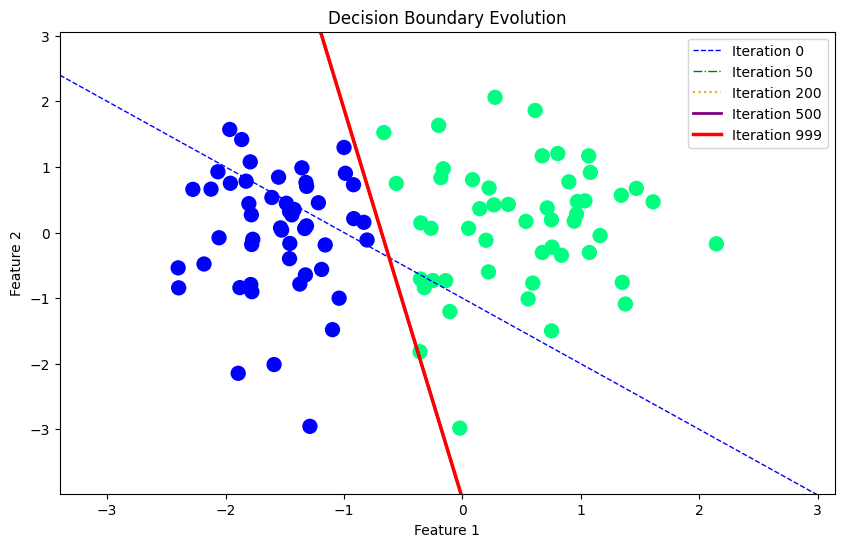

In [9]:
# Let's also create a static plot showing multiple decision boundaries
plt.figure(figsize=(10, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)

# Show decision boundaries at different iterations
for i, iteration in enumerate([0, 50, 200, 500, 999]):
    weights = weights_history[iteration]
    m = -weights[1] / weights[2]
    b = -weights[0] / weights[2]
    
    x_input = np.linspace(x_min, x_max, 100)
    y_input = m * x_input + b
    
    # Use different colors and line styles for different iterations
    colors = ['blue', 'green', 'orange', 'purple', 'red']
    styles = ['--', '-.', ':', '-', '-']
    widths = [1, 1, 1.5, 2, 2.5]
    
    plt.plot(x_input, y_input, color=colors[i], linestyle=styles[i], 
             linewidth=widths[i], label=f'Iteration {iteration}')

plt.title('Decision Boundary Evolution')
plt.xlabel('Feature 1')
plt.ylabel('Feature 2')
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)
plt.legend()
plt.show()

In [ ]:
# Alternative approach - Save frames manually
import matplotlib.pyplot as plt
from matplotlib.animation import ArtistAnimation

# Create frames at regular intervals
fig, ax = plt.subplots(figsize=(10, 6))
plt.scatter(X[:, 0], X[:, 1], c=y, cmap='winter', s=100)
plt.xlim(x_min, x_max)
plt.ylim(y_min, y_max)

frames = []
step_size = 10  # Save every 10th frame

for i in range(0, len(weights_history), step_size):
    weights = weights_history[i]
    x_line, y_line = get_line_points(weights)
    
    # Create a new line for each frame
    line, = ax.plot(x_line, y_line, 'r-', linewidth=2)
    text = ax.text(0.02, 0.95, f'Iteration: {i}', transform=ax.transAxes, fontsize=12)
    
    frames.append([line, text])
    
    # Remove line and text for next frame
    line.remove()
    text.remove()

# Create animation from frames
ani = ArtistAnimation(fig, frames, interval=100, blit=True)
HTML(ani.to_jshtml())